# Exploratory Data Analysis: Oxford-IIIT Pet Dataset

This notebook provides a first look at the Oxford-IIIT Pet Dataset, exploring its structure, class distribution, and image characteristics. We'll visualize samples from different classes and analyze key properties to better understand the dataset before starting the transfer learning project.

## Setup and Dependencies

First, let's import the necessary packages:

In [3]:
import os
import sys
import random
import numpy as np
import pandas as pd
from pathlib import Path
from collections import Counter, defaultdict
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import xml.etree.ElementTree as ET

# Add parent directory to path to import project modules
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

# Set plot style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('viridis')

# Set random seed for reproducibility
random.seed(42)
np.random.seed(42)

## Locate Dataset

Check if the dataset has been downloaded and determine its location:

In [4]:
# Set paths
DATA_ROOT = Path('../data')
RAW_DATA_DIR = DATA_ROOT / 'raw'
PROCESSED_DATA_DIR = DATA_ROOT / 'processed'

# Check if dataset exists
images_dir = RAW_DATA_DIR / 'images'
annotations_dir = RAW_DATA_DIR / 'annotations'

if not images_dir.exists() or not annotations_dir.exists():
    print("Dataset not found! Please run the download_data.py script first.")
    print("You can do this with: python ../scripts/download_data.py")
else:
    print(f"Dataset found at {RAW_DATA_DIR}")
    print(f"Images directory: {images_dir} (exists: {images_dir.exists()})")
    print(f"Annotations directory: {annotations_dir} (exists: {annotations_dir.exists()})")

Dataset found at ../data/raw
Images directory: ../data/raw/images (exists: True)
Annotations directory: ../data/raw/annotations (exists: True)


## Dataset Overview

The Oxford-IIIT Pet Dataset contains images of 37 pet breeds (cats and dogs) with roughly 200 images for each class. Let's first understand the structure of the dataset:

In [32]:
# Count total images
image_count = len(list(images_dir.glob('*.jpg')))
print(f"Total number of images: {image_count}")

# Read annotations to get class information
annotations_file = annotations_dir / 'trainval.txt'
annotations = []

with open(annotations_file, 'r') as f:
    for line in f:
        if line.strip() and not line.startswith('#'):
            parts = line.strip().split()
            if len(parts) >= 3:
                image_id = parts[0]
                # Class ID is 1-indexed in the dataset
                class_id = int(parts[1]) - 1  # Convert to 0-indexed
                # Species: 1 = Cat, 2 = Dog
                species = 'cat' if int(parts[2]) == 1 else 'dog'
                
                annotations.append({
                    'image_id': image_id,
                    'class_id': class_id,
                    'species': species
                })

# Convert to DataFrame for easier analysis
df = pd.DataFrame(annotations)
print(f"Number of annotated images: {len(df)}")

Total number of images: 7390
Number of annotated images: 3680


In [37]:
df.head()

,image_id,class_id,species
0,Abyssinian_100,0,cat
1,Abyssinian_101,0,cat
2,Abyssinian_102,0,cat
3,Abyssinian_103,0,cat
4,Abyssinian_104,0,cat


In [38]:
# print one row of each class id

# Group the DataFrame by 'class_id' and take the first row of each group
unique_classes = df.groupby('class_id').first().reset_index()

# Print one row for each class id
print(unique_classes)

# Extract the list of image_id names without the '_100' suffix
image_id_names = unique_classes['image_id'].apply(lambda x: x.rsplit('_', 1)[0]).tolist()



    class_id                        image_id species
0          0                  Abyssinian_100     cat
1          1            american_bulldog_100     dog
2          2   american_pit_bull_terrier_100     dog
3          3                basset_hound_100     dog
4          4                      beagle_100     dog
5          5                      Bengal_100     cat
6          6                      Birman_100     cat
7          7                      Bombay_100     cat
8          8                       boxer_100     dog
9          9           British_Shorthair_100     cat
10        10                   chihuahua_100     dog
11        11                Egyptian_Mau_100     cat
12        12      english_cocker_spaniel_100     dog
13        13              english_setter_100     dog
14        14          german_shorthaired_100     dog
15        15              great_pyrenees_100     dog
16        16                    havanese_100     dog
17        17               japanese_chin_100  

In [39]:
image_id_names

['Abyssinian',
 'american_bulldog',
 'american_pit_bull_terrier',
 'basset_hound',
 'beagle',
 'Bengal',
 'Birman',
 'Bombay',
 'boxer',
 'British_Shorthair',
 'chihuahua',
 'Egyptian_Mau',
 'english_cocker_spaniel',
 'english_setter',
 'german_shorthaired',
 'great_pyrenees',
 'havanese',
 'japanese_chin',
 'keeshond',
 'leonberger',
 'Maine_Coon',
 'miniature_pinscher',
 'newfoundland',
 'Persian',
 'pomeranian',
 'pug',
 'Ragdoll',
 'Russian_Blue',
 'saint_bernard',
 'samoyed',
 'scottish_terrier',
 'shiba_inu',
 'Siamese',
 'Sphynx',
 'staffordshire_bull_terrier',
 'wheaten_terrier',
 'yorkshire_terrier']

Now, let's define the class names (breeds) for both cats and dogs:

In [40]:
# Define cat and dog breeds
cat_breeds = [
    "Abyssinian", "Bengal", "Birman", "Bombay", "British_Shorthair", 
    "Egyptian_Mau", "Maine_Coon", "Persian", "Ragdoll", "Russian_Blue", 
    "Siamese", "Sphynx"
]

dog_breeds = [
    "american_bulldog", "american_pit_bull_terrier", "basset_hound", 
    "beagle", "boxer", "chihuahua", "english_cocker_spaniel", 
    "english_setter", "german_shorthaired", "great_pyrenees", 
    "havanese", "japanese_chin", "keeshond", "leonberger", 
    "miniature_pinscher", "newfoundland", "pomeranian", "pug", 
    "saint_bernard", "samoyed", "scottish_terrier", "shiba_inu", 
    "staffordshire_bull_terrier", "wheaten_terrier", "yorkshire_terrier"
]

all_breeds = ['Abyssinian',
 'american_bulldog',
 'american_pit_bull_terrier',
 'basset_hound',
 'beagle',
 'Bengal',
 'Birman',
 'Bombay',
 'boxer',
 'British_Shorthair',
 'chihuahua',
 'Egyptian_Mau',
 'english_cocker_spaniel',
 'english_setter',
 'german_shorthaired',
 'great_pyrenees',
 'havanese',
 'japanese_chin',
 'keeshond',
 'leonberger',
 'Maine_Coon',
 'miniature_pinscher',
 'newfoundland',
 'Persian',
 'pomeranian',
 'pug',
 'Ragdoll',
 'Russian_Blue',
 'saint_bernard',
 'samoyed',
 'scottish_terrier',
 'shiba_inu',
 'Siamese',
 'Sphynx',
 'staffordshire_bull_terrier',
 'wheaten_terrier',
 'yorkshire_terrier']

print(f"Number of cat breeds: {len(cat_breeds)}")
print(f"Number of dog breeds: {len(dog_breeds)}")
print(f"Total number of breeds: {len(all_breeds)}")

# Add breed names to DataFrame
df['breed'] = df['class_id'].apply(lambda x: all_breeds[x])

Number of cat breeds: 12
Number of dog breeds: 25
Total number of breeds: 37


## Class Distribution

Let's analyze the distribution of classes in the dataset:

Species distribution:
species
dog    2492
cat    1188
Name: count, dtype: int64


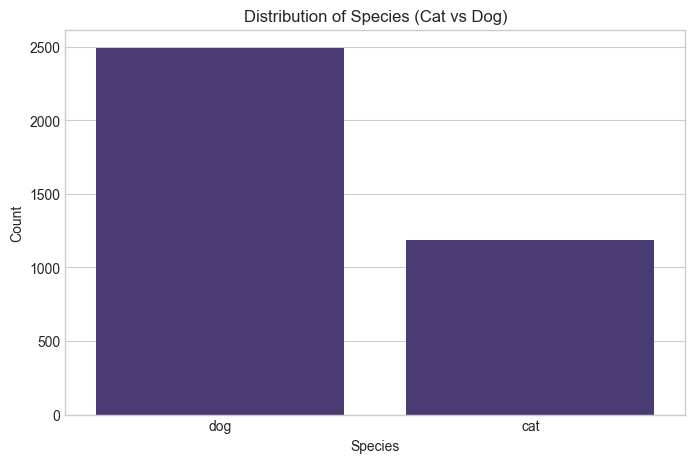

In [41]:
# Count samples per species
species_counts = df['species'].value_counts()
print("Species distribution:")
print(species_counts)

# Visualize species distribution
plt.figure(figsize=(8, 5))
sns.barplot(x=species_counts.index, y=species_counts.values)
plt.title('Distribution of Species (Cat vs Dog)')
plt.xlabel('Species')
plt.ylabel('Count')
plt.show()

In [42]:
# Count samples per breed
breed_counts = df['breed'].value_counts().sort_values(ascending=False)
print(f"Samples per breed (showing top 10):")
print(breed_counts.head(10))

# Check for class imbalance
min_samples = breed_counts.min()
max_samples = breed_counts.max()
print(f"\nMinimum samples per breed: {min_samples} ({breed_counts.idxmin()})")
print(f"Maximum samples per breed: {max_samples} ({breed_counts.idxmax()})")
print(f"Imbalance ratio (max/min): {max_samples/min_samples:.2f}")

Samples per breed (showing top 10):
breed
Abyssinian                   100
american_bulldog             100
american_pit_bull_terrier    100
basset_hound                 100
beagle                       100
Bengal                       100
Birman                       100
boxer                        100
British_Shorthair            100
chihuahua                    100
Name: count, dtype: int64

Minimum samples per breed: 93 (Egyptian_Mau)
Maximum samples per breed: 100 (Abyssinian)
Imbalance ratio (max/min): 1.08


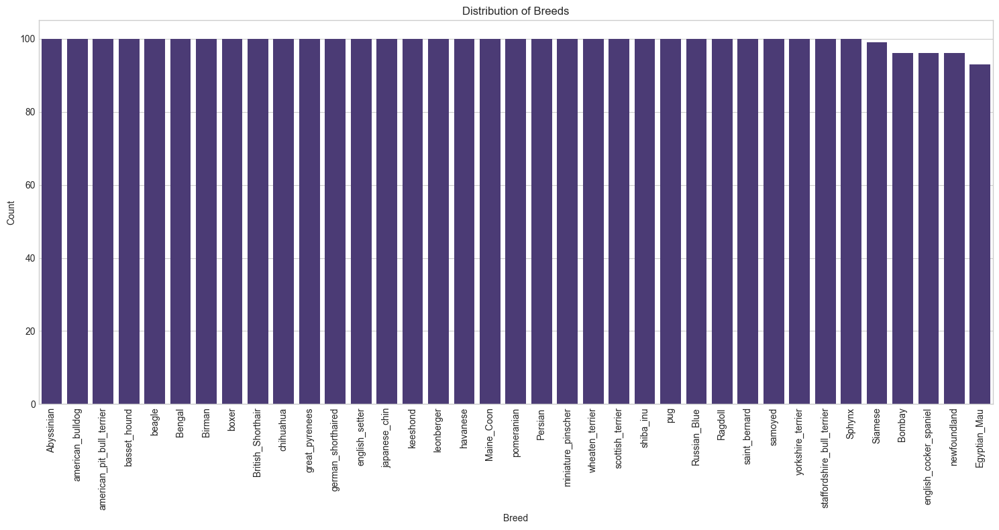

In [43]:
# Visualize breed distribution
plt.figure(figsize=(15, 8))
sns.barplot(x=breed_counts.index, y=breed_counts.values)
plt.title('Distribution of Breeds')
plt.xlabel('Breed')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

/var/folders/m7/n_7wlxws2c78dvvqtvvsykl40000gn/T/ipykernel_74073/987609844.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cat_breed_counts.index, y=cat_breed_counts.values, ax=ax1, palette='Blues_d')
/var/folders/m7/n_7wlxws2c78dvvqtvvsykl40000gn/T/ipykernel_74073/987609844.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=dog_breed_counts.index, y=dog_breed_counts.values, ax=ax2, palette='Oranges_d')


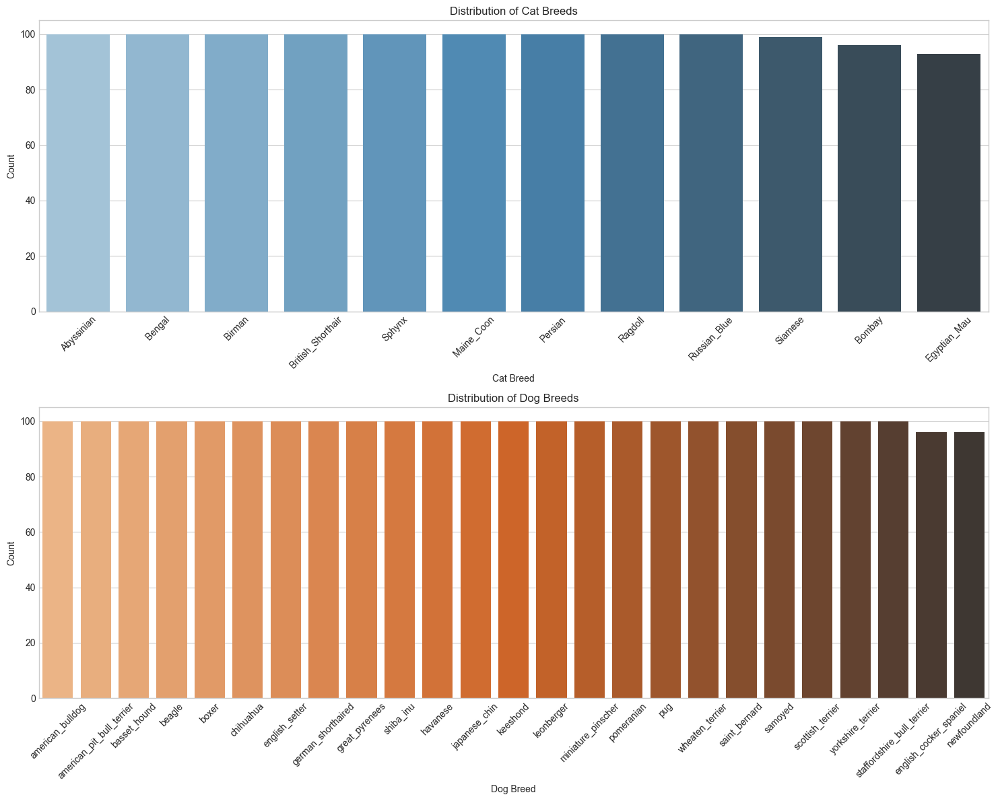

In [44]:
# Separate cat and dog breed distributions
cat_breed_counts = df[df['species'] == 'cat']['breed'].value_counts().sort_values(ascending=False)
dog_breed_counts = df[df['species'] == 'dog']['breed'].value_counts().sort_values(ascending=False)

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12))

# Cat breeds
sns.barplot(x=cat_breed_counts.index, y=cat_breed_counts.values, ax=ax1, palette='Blues_d')
ax1.set_title('Distribution of Cat Breeds')
ax1.set_xlabel('Cat Breed')
ax1.set_ylabel('Count')
ax1.tick_params(axis='x', rotation=45)

# Dog breeds
sns.barplot(x=dog_breed_counts.index, y=dog_breed_counts.values, ax=ax2, palette='Oranges_d')
ax2.set_title('Distribution of Dog Breeds')
ax2.set_xlabel('Dog Breed')
ax2.set_ylabel('Count')
ax2.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

## Image Exploration

Let's explore some image samples from the dataset to understand their characteristics:

In [45]:
def load_image(image_id):
    """Load image given image_id."""
    image_path = images_dir / f"{image_id}.jpg"
    return Image.open(image_path)

def show_random_samples(species=None, breed=None, n_samples=5):
    """Show random samples from a specific species or breed."""
    filtered_df = df.copy()
    title = "Random Samples"
    
    if species:
        filtered_df = filtered_df[filtered_df['species'] == species]
        title = f"Random {species.title()} Samples"
    
    if breed:
        filtered_df = filtered_df[filtered_df['breed'] == breed]
        title = f"Random {breed} Samples"
    
    # Randomly select n_samples
    if len(filtered_df) < n_samples:
        print(f"Warning: Only {len(filtered_df)} samples available")
        n_samples = len(filtered_df)
    
    sample_rows = filtered_df.sample(n_samples)
    
    # Create figure
    fig, axes = plt.subplots(1, n_samples, figsize=(n_samples * 4, 4))
    if n_samples == 1:
        axes = [axes]
    
    # Display images
    for i, (_, row) in enumerate(sample_rows.iterrows()):
        image = load_image(row['image_id'])
        axes[i].imshow(image)
        axes[i].set_title(f"{row['breed']}\n{row['species'].title()}")
        axes[i].axis('off')
    
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)
    plt.show()

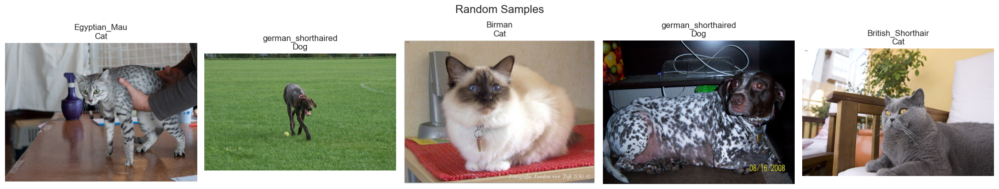

In [46]:
# Show random samples from the dataset
show_random_samples(n_samples=5)

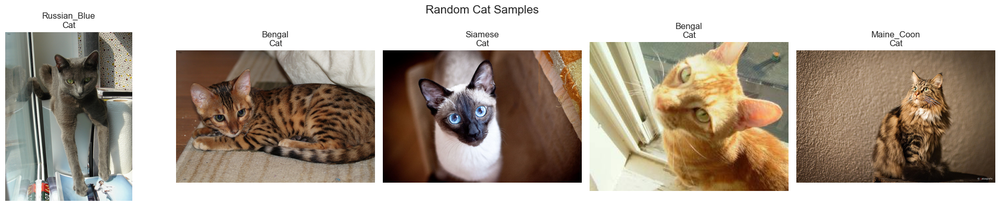

In [47]:
# Show random cat samples
show_random_samples(species='cat', n_samples=5)

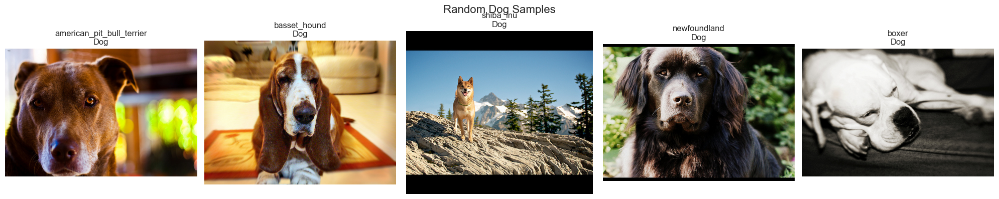

In [48]:
# Show random dog samples
show_random_samples(species='dog', n_samples=5)

## Image Characteristics

Let's analyze image dimensions, aspect ratios, and other properties to understand the characteristics of the dataset:

In [49]:
# Sample images to analyze (use a subset for faster analysis)
sample_size = min(500, len(df))
sampled_df = df.sample(sample_size, random_state=42)

# Collect image properties
image_properties = []

for _, row in sampled_df.iterrows():
    try:
        image = load_image(row['image_id'])
        width, height = image.size
        aspect_ratio = width / height
        image_size = width * height
        
        image_properties.append({
            'image_id': row['image_id'],
            'breed': row['breed'],
            'species': row['species'],
            'width': width,
            'height': height,
            'aspect_ratio': aspect_ratio,
            'image_size': image_size
        })
    except Exception as e:
        print(f"Error processing image {row['image_id']}: {e}")

# Convert to DataFrame
props_df = pd.DataFrame(image_properties)
props_df.head()

,image_id,breed,species,width,height,aspect_ratio,image_size
0,newfoundland_101,newfoundland,dog,500,333,1.501502,166500
1,keeshond_190,keeshond,dog,375,500,0.750000,187500
2,english_cocker_spaniel_147,english_cocker_spaniel,dog,500,335,1.492537,167500
3,Sphynx_158,Sphynx,cat,500,500,1.000000,250000
4,english_setter_154,english_setter,dog,317,352,0.900568,111584


In [50]:
# Summarize image dimensions
print("Image width statistics:")
print(props_df['width'].describe())
print("\nImage height statistics:")
print(props_df['height'].describe())
print("\nImage aspect ratio statistics:")
print(props_df['aspect_ratio'].describe())

Image width statistics:
count     500.000000
mean      421.382000
std       110.573782
min       133.000000
25%       333.000000
50%       500.000000
75%       500.000000
max      1152.000000
Name: width, dtype: float64

Image height statistics:
count     500.000000
mean      383.114000
std       116.955591
min       112.000000
25%       332.000000
50%       375.000000
75%       500.000000
max      1734.000000
Name: height, dtype: float64

Image aspect ratio statistics:
count    500.000000
mean       1.155819
std        0.323789
min        0.600000
25%        0.750000
50%        1.333333
75%        1.400560
max        1.779359
Name: aspect_ratio, dtype: float64


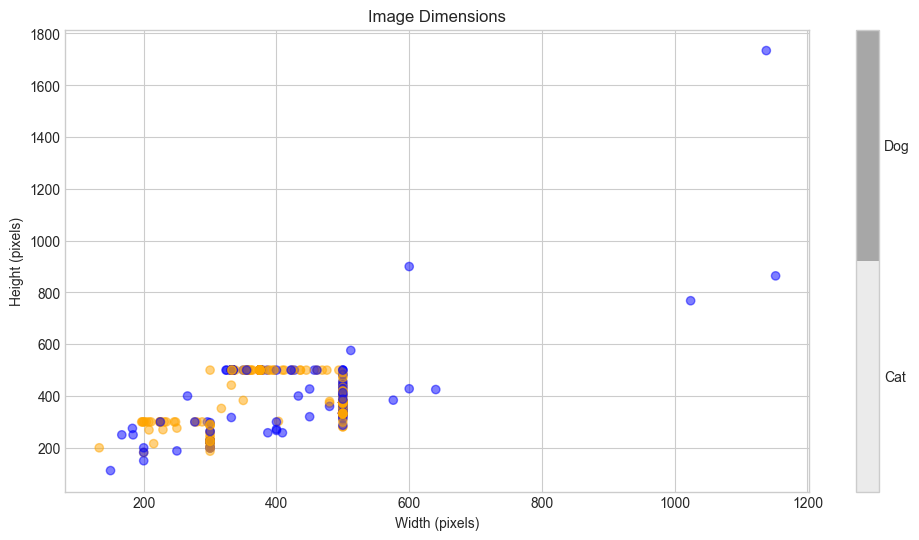

In [51]:
# Visualize image dimensions
plt.figure(figsize=(12, 6))

# Create the scatter plot and store the mappable object
scatter = plt.scatter(props_df['width'], props_df['height'], alpha=0.5, c=props_df['species'].map({'cat': 'blue', 'dog': 'orange'}))

plt.title('Image Dimensions')
plt.xlabel('Width (pixels)')
plt.ylabel('Height (pixels)')
plt.grid(True)

# Add colorbar using the scatter plot's mappable object
cbar = plt.colorbar(scatter, ticks=[0.25, 0.75], boundaries=[0, 0.5, 1])
cbar.set_ticklabels(['Cat', 'Dog'])

plt.show()

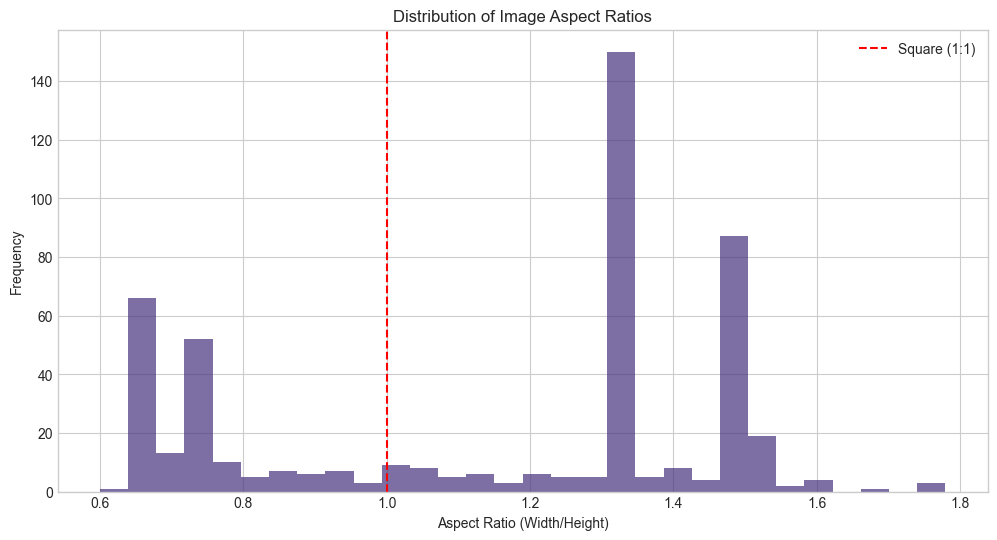

In [52]:
# Visualize aspect ratios
plt.figure(figsize=(12, 6))

# Normalize aspect ratios for plotting
plt.hist(props_df['aspect_ratio'], bins=30, alpha=0.7)
plt.axvline(x=1.0, color='red', linestyle='--', label='Square (1:1)')
plt.title('Distribution of Image Aspect Ratios')
plt.xlabel('Aspect Ratio (Width/Height)')
plt.ylabel('Frequency')
plt.grid(True)
plt.legend()
plt.show()

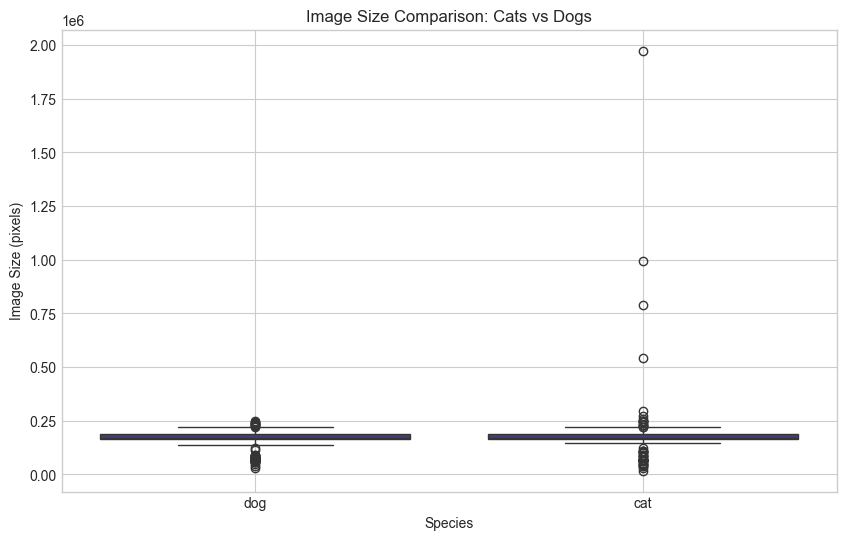

In [53]:
# Compare image sizes between cats and dogs
plt.figure(figsize=(10, 6))
sns.boxplot(x='species', y='image_size', data=props_df)
plt.title('Image Size Comparison: Cats vs Dogs')
plt.xlabel('Species')
plt.ylabel('Image Size (pixels)')
plt.grid(True)
plt.show()

## Image Pixel Value Distribution

Let's analyze the distribution of pixel values to understand image statistics useful for normalization:

In [54]:
# Sample a smaller subset for pixel analysis
pixel_sample_size = min(50, len(df))
pixel_sampled_df = df.sample(pixel_sample_size, random_state=42)

# Collect pixel statistics
r_values = []
g_values = []
b_values = []

for _, row in pixel_sampled_df.iterrows():
    try:
        image = load_image(row['image_id'])
        img_array = np.array(image)
        
        # Flatten and append values for each channel
        if len(img_array.shape) == 3:  # RGB image
            r_values.extend(img_array[:, :, 0].flatten())
            g_values.extend(img_array[:, :, 1].flatten())
            b_values.extend(img_array[:, :, 2].flatten())
    except Exception as e:
        print(f"Error processing image {row['image_id']}: {e}")

In [55]:
# Calculate channel statistics
r_mean, r_std = np.mean(r_values) / 255.0, np.std(r_values) / 255.0
g_mean, g_std = np.mean(g_values) / 255.0, np.std(g_values) / 255.0
b_mean, b_std = np.mean(b_values) / 255.0, np.std(b_values) / 255.0

print("Channel statistics (normalized to [0,1]):")
print(f"Red:   Mean = {r_mean:.4f}, Std = {r_std:.4f}")
print(f"Green: Mean = {g_mean:.4f}, Std = {g_std:.4f}")
print(f"Blue:  Mean = {b_mean:.4f}, Std = {b_std:.4f}")
print("\nSuggested normalization values for model training:")
print(f"mean = [{r_mean:.4f}, {g_mean:.4f}, {b_mean:.4f}]")
print(f"std = [{r_std:.4f}, {g_std:.4f}, {b_std:.4f}]")

Channel statistics (normalized to [0,1]):
Red:   Mean = 0.4852, Std = 0.2456
Green: Mean = 0.3926, Std = 0.2562
Blue:  Mean = 0.3730, Std = 0.2474

Suggested normalization values for model training:
mean = [0.4852, 0.3926, 0.3730]
std = [0.2456, 0.2562, 0.2474]


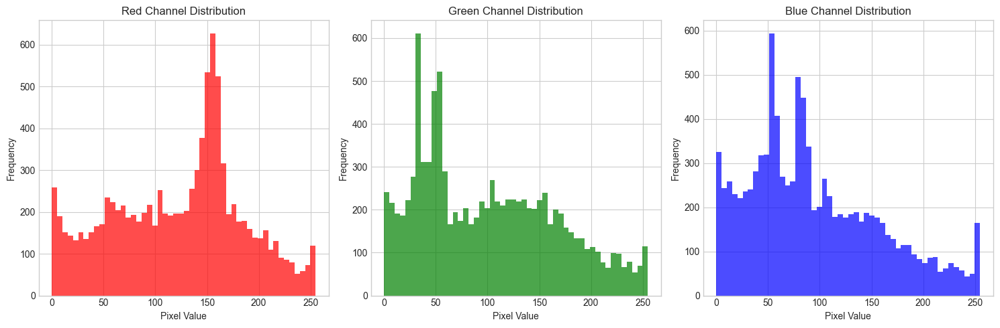

In [56]:
# Visualize pixel value distributions
plt.figure(figsize=(15, 5))

# Sample a subset of values for plotting (for performance)
sample_size = min(10000, len(r_values))
r_sample = random.sample(r_values, sample_size)
g_sample = random.sample(g_values, sample_size)
b_sample = random.sample(b_values, sample_size)

plt.subplot(1, 3, 1)
plt.hist(r_sample, bins=50, color='red', alpha=0.7)
plt.title('Red Channel Distribution')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.subplot(1, 3, 2)
plt.hist(g_sample, bins=50, color='green', alpha=0.7)
plt.title('Green Channel Distribution')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.subplot(1, 3, 3)
plt.hist(b_sample, bins=50, color='blue', alpha=0.7)
plt.title('Blue Channel Distribution')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

## Class Visual Similarities

Let's look at some examples of breeds that might be visually similar and challenging to distinguish:

In [57]:
# Function to show examples from pairs of potentially similar breeds
def show_similar_breeds(breed1, breed2, n_samples=3):
    """
    Show samples from two potentially similar breeds for comparison.
    """
    breed1_samples = df[df['breed'] == breed1].sample(min(n_samples, len(df[df['breed'] == breed1])))
    breed2_samples = df[df['breed'] == breed2].sample(min(n_samples, len(df[df['breed'] == breed2])))
    
    fig, axes = plt.subplots(2, n_samples, figsize=(n_samples * 4, 8))
    
    # Display breed1 samples
    for i, (_, row) in enumerate(breed1_samples.iterrows()):
        image = load_image(row['image_id'])
        axes[0, i].imshow(image)
        axes[0, i].set_title(f"{row['breed']}")
        axes[0, i].axis('off')
    
    # Display breed2 samples
    for i, (_, row) in enumerate(breed2_samples.iterrows()):
        image = load_image(row['image_id'])
        axes[1, i].imshow(image)
        axes[1, i].set_title(f"{row['breed']}")
        axes[1, i].axis('off')
    
    plt.suptitle(f"Comparison: {breed1} vs {breed2}", fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

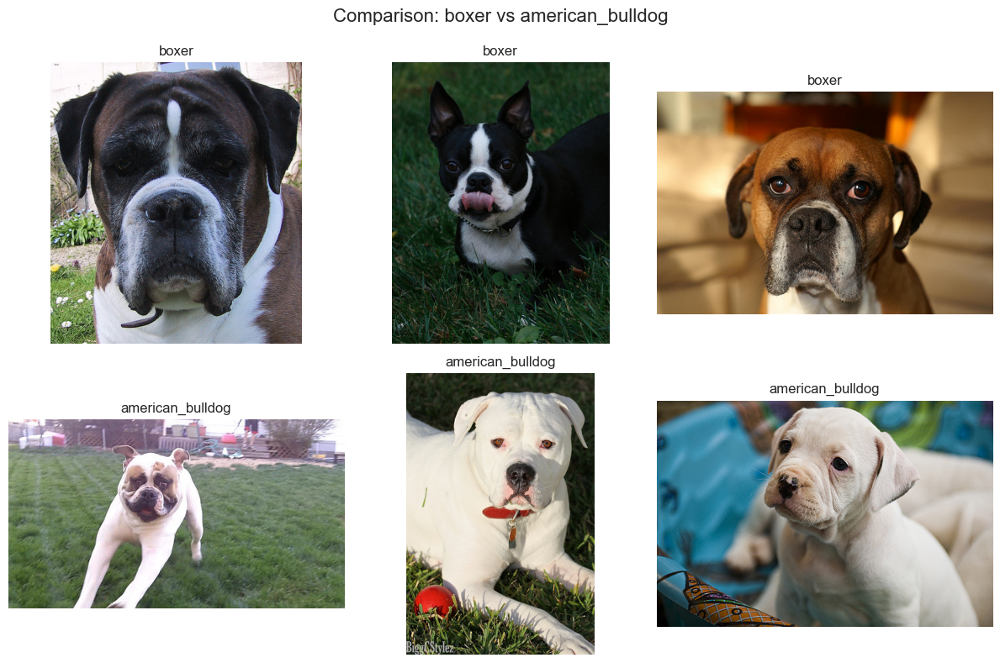

In [58]:
# Examples of potentially similar cat breeds
show_similar_breeds('boxer', 'american_bulldog')

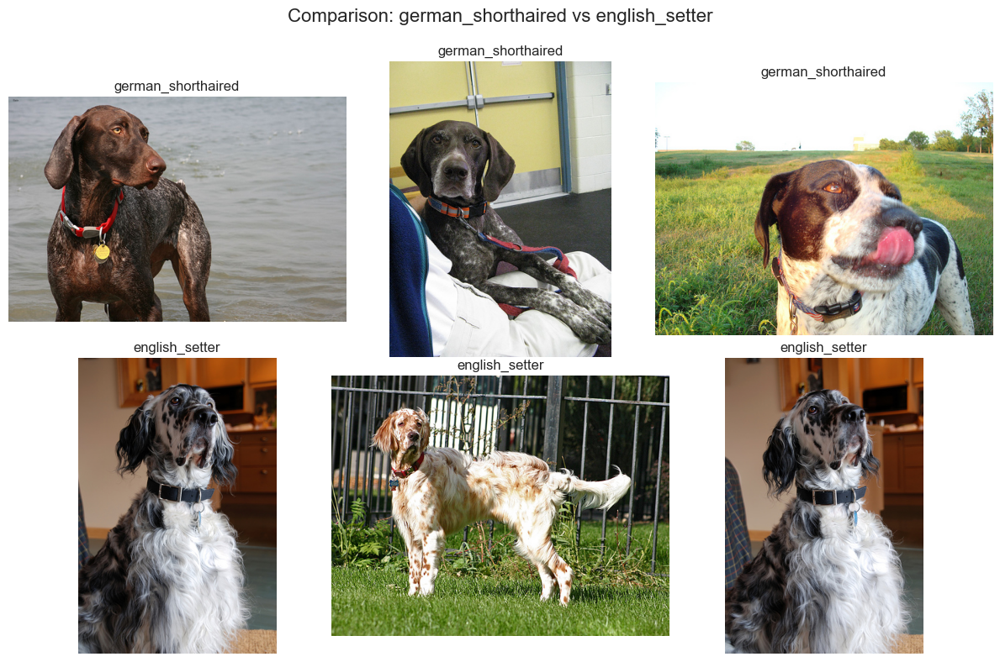

In [59]:
# Examples of potentially similar dog breeds
show_similar_breeds('german_shorthaired', 'english_setter')

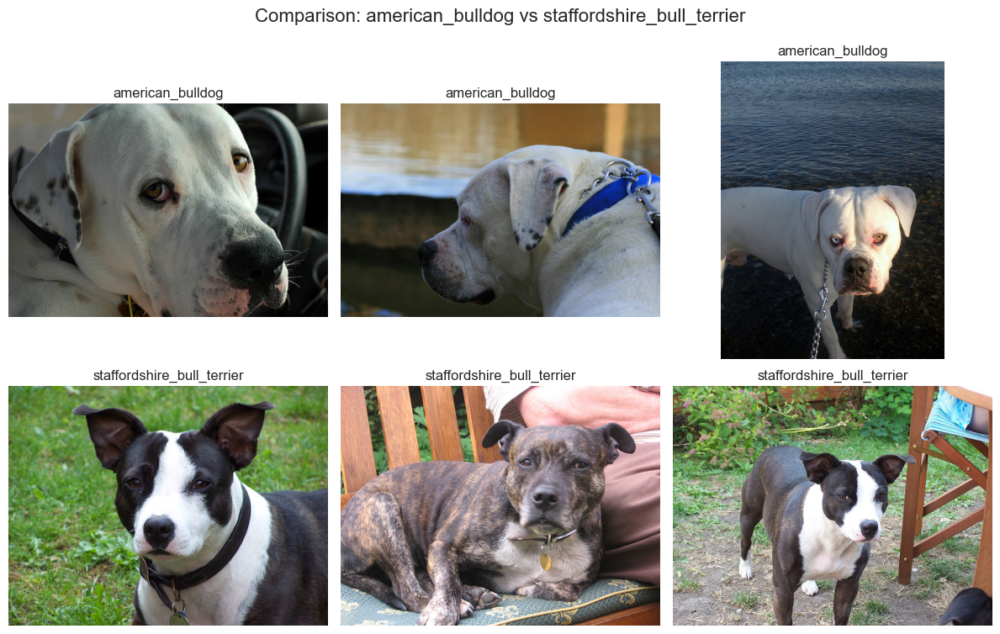

In [60]:
# Another example of similar dog breeds
show_similar_breeds('american_bulldog', 'staffordshire_bull_terrier')

## Image Background Analysis

Let's analyze the backgrounds of images to understand potential challenges:

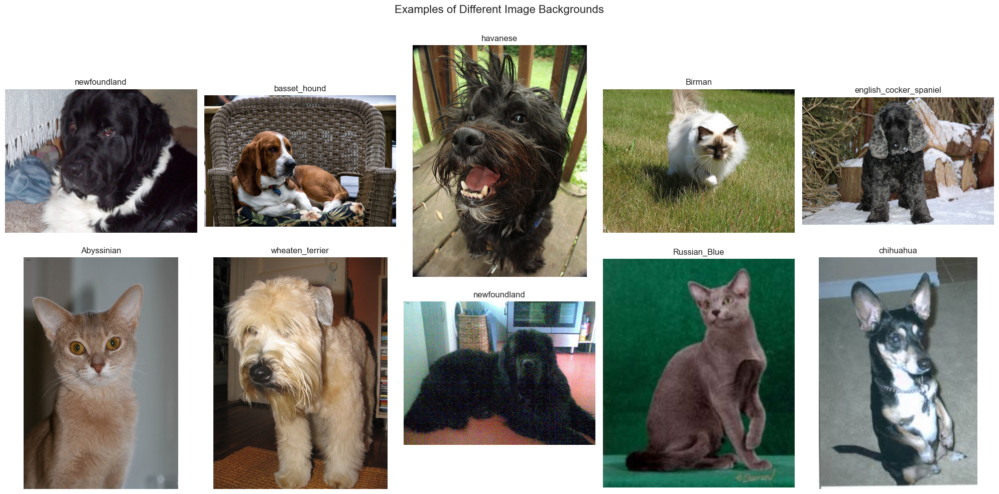

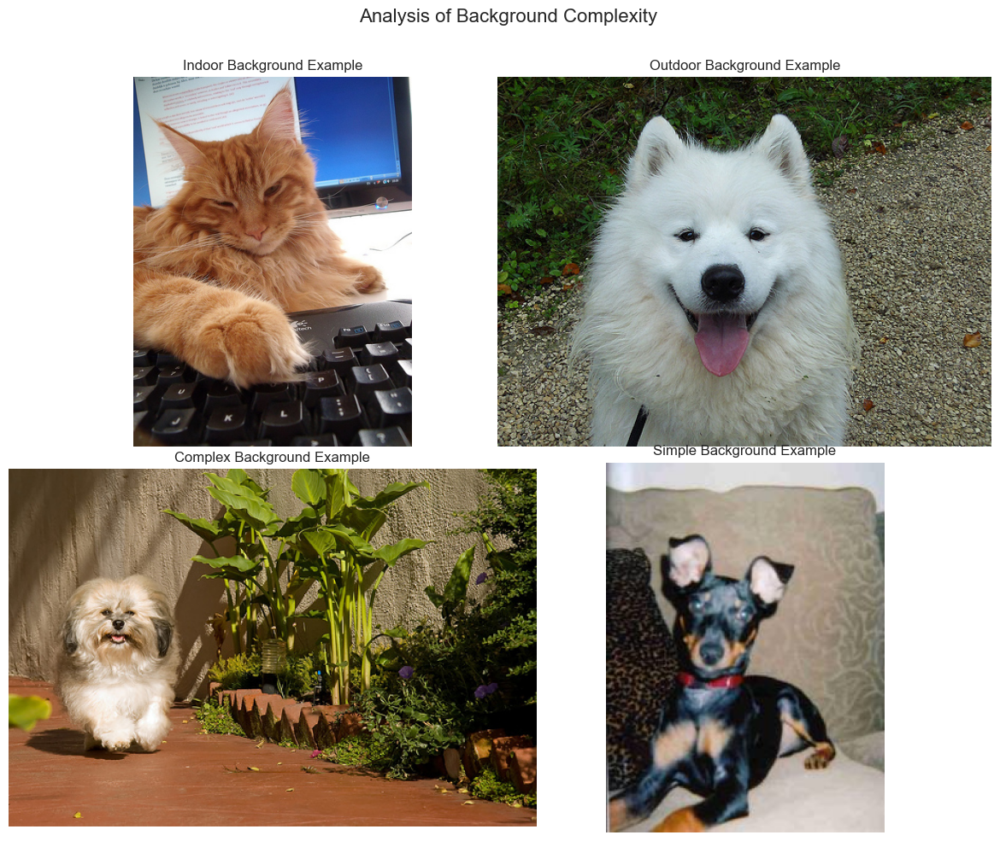

In [61]:
# Show some examples with different backgrounds
background_samples = df.sample(10)

plt.figure(figsize=(20, 10))
for i, (_, row) in enumerate(background_samples.iterrows()):
    plt.subplot(2, 5, i+1)
    image = load_image(row['image_id'])
    plt.imshow(image)
    plt.title(row['breed'])
    plt.axis('off')
    
plt.suptitle('Examples of Different Image Backgrounds', fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

# Show examples of various background complexities
def analyze_background_types():
    # Sample some images with different background characteristics
    indoor_id = df.sample(1).iloc[0]['image_id']
    outdoor_id = df.sample(1).iloc[0]['image_id']
    complex_id = df.sample(1).iloc[0]['image_id']
    simple_id = df.sample(1).iloc[0]['image_id']
    
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    
    # Display images
    axes[0, 0].imshow(load_image(indoor_id))
    axes[0, 0].set_title("Indoor Background Example")
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(load_image(outdoor_id))
    axes[0, 1].set_title("Outdoor Background Example")
    axes[0, 1].axis('off')
    
    axes[1, 0].imshow(load_image(complex_id))
    axes[1, 0].set_title("Complex Background Example")
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(load_image(simple_id))
    axes[1, 1].set_title("Simple Background Example")
    axes[1, 1].axis('off')
    
    plt.suptitle("Analysis of Background Complexity", fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

# Note: User should manually select good examples of each category
# This function is provided as a template
analyze_background_types()

# Note: User should manually select good examples of each category
# This function is provided as a template


## Pet Pose Analysis

Let's examine the different poses and orientations of pets in the dataset:

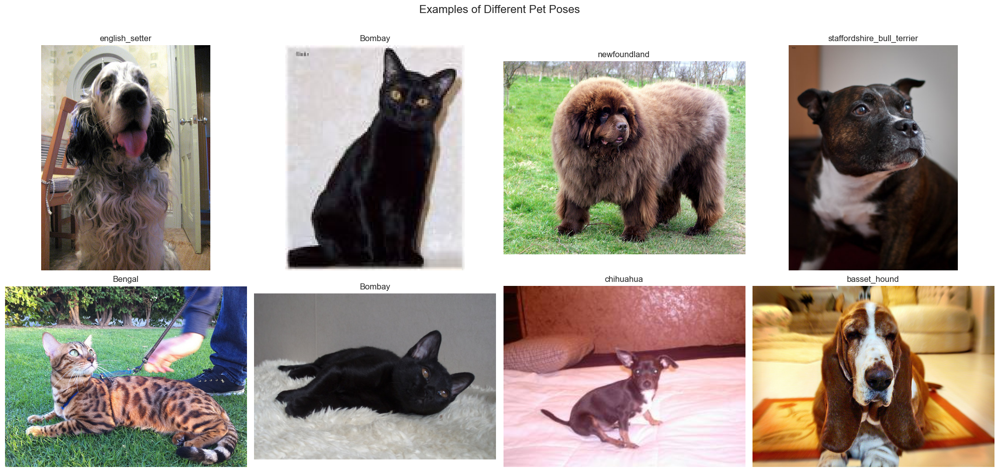

In [62]:
# Sample images with different poses
poses_samples = df.sample(8)

plt.figure(figsize=(20, 10))
for i, (_, row) in enumerate(poses_samples.iterrows()):
    plt.subplot(2, 4, i+1)
    image = load_image(row['image_id'])
    plt.imshow(image)
    plt.title(f"{row['breed']}")
    plt.axis('off')
    
plt.suptitle('Examples of Different Pet Poses', fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

## Examining Image Quality

Let's look at the range of image quality in the dataset:

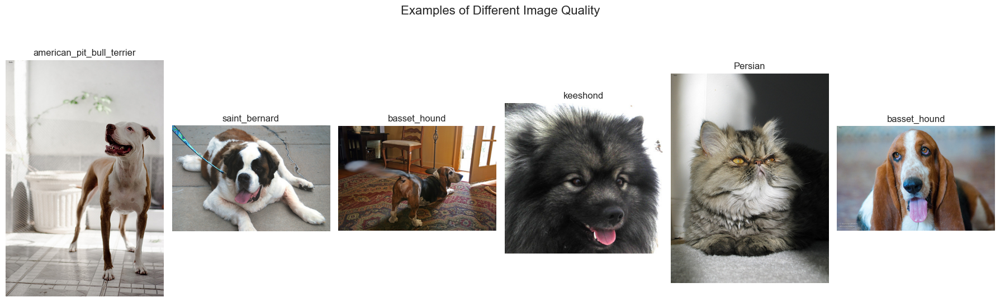

In [63]:
# Sample some images to examine quality
quality_samples = df.sample(6)

plt.figure(figsize=(18, 6))
for i, (_, row) in enumerate(quality_samples.iterrows()):
    plt.subplot(1, 6, i+1)
    image = load_image(row['image_id'])
    plt.imshow(image)
    plt.title(f"{row['breed']}")
    plt.axis('off')
    
plt.suptitle('Examples of Different Image Quality', fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

## Examining Segmentation Masks

The Oxford-IIIT Pet Dataset also includes segmentation masks. Let's examine them:

Segmentation masks found at ../data/raw/annotations/trimaps


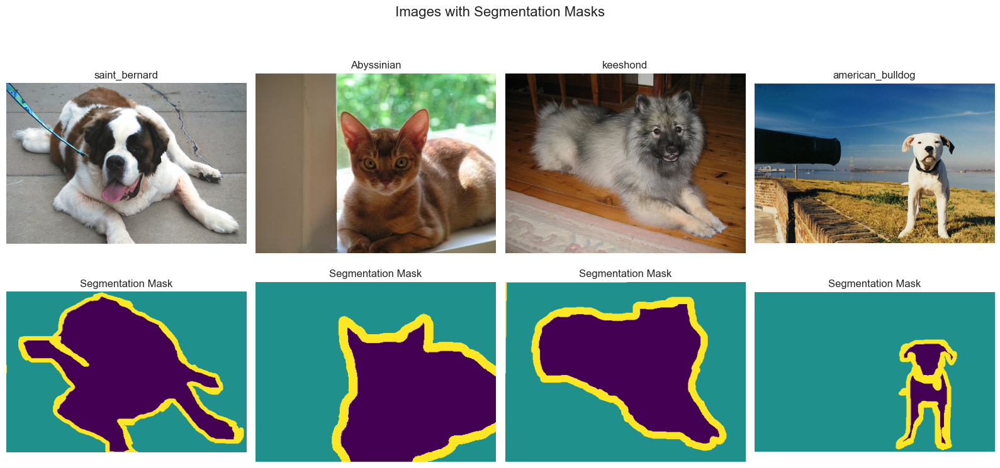

In [64]:
# Check if segmentation masks are available
masks_dir = annotations_dir / 'trimaps'
if not masks_dir.exists():
    print("Segmentation masks not found in annotations directory.")
else:
    print(f"Segmentation masks found at {masks_dir}")
    
    # Function to load mask
    def load_mask(image_id):
        mask_path = masks_dir / f"{image_id}.png"
        if mask_path.exists():
            return Image.open(mask_path)
        return None
    
    # Show some examples with masks
    mask_samples = df.sample(4)
    
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    
    for i, (_, row) in enumerate(mask_samples.iterrows()):
        # Original image
        image = load_image(row['image_id'])
        axes[0, i].imshow(image)
        axes[0, i].set_title(f"{row['breed']}")
        axes[0, i].axis('off')
        
        # Segmentation mask
        mask = load_mask(row['image_id'])
        if mask is not None:
            axes[1, i].imshow(mask, cmap='viridis')
            axes[1, i].set_title("Segmentation Mask")
            axes[1, i].axis('off')
        else:
            axes[1, i].text(0.5, 0.5, "Mask not found", ha='center', va='center')
            axes[1, i].axis('off')
    
    plt.suptitle('Images with Segmentation Masks', fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

## Augmentation Examples

Let's visualize some potential augmentations that can be applied during training:

RuntimeError: Numpy is not available

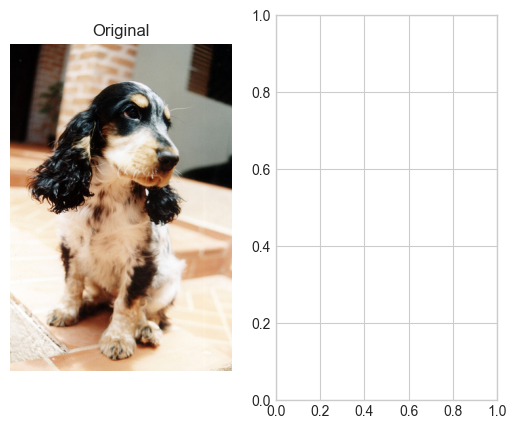

In [66]:
from torchvision import transforms

# Sample one image for augmentation demonstration
sample_row = df.sample(1).iloc[0]
sample_image = load_image(sample_row['image_id'])

# Define augmentations
augmentations = [
    ('Original', transforms.ToTensor()),
    ('Horizontal Flip', transforms.Compose([
        transforms.RandomHorizontalFlip(p=1.0),
        transforms.ToTensor()
    ])),
    ('Rotation', transforms.Compose([
        transforms.RandomRotation(15),
        transforms.ToTensor()
    ])),
    ('Color Jitter', transforms.Compose([
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        transforms.ToTensor()
    ])),
    ('Random Crop', transforms.Compose([
        transforms.RandomResizedCrop(size=(sample_image.size[1], sample_image.size[0]), scale=(0.8, 1.0)),
        transforms.ToTensor()
    ])),
    ('Grayscale', transforms.Compose([
        transforms.RandomGrayscale(p=1.0),
        transforms.ToTensor()
    ]))
]

# Apply and visualize augmentations
plt.figure(figsize=(20, 5))
for i, (name, transform) in enumerate(augmentations):
    plt.subplot(1, 6, i+1)
    
    if i == 0:  # Original image
        plt.imshow(sample_image)
    else:
        # Apply transformation and convert back to PIL for display
        augmented = transform(sample_image)
        # Convert tensor to numpy for display
        if isinstance(augmented, torch.Tensor):
            augmented = augmented.permute(1, 2, 0).numpy()
        plt.imshow(augmented)
    
    plt.title(name)
    plt.axis('off')
    
plt.suptitle(f'Augmentation Examples - {sample_row["breed"]}', fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

## Summary and Insights

Let's summarize our findings from the exploratory data analysis:

### Key Dataset Statistics
- Total number of images: ~7,000
- Number of classes: 37 (12 cat breeds, 25 dog breeds)
- Dog vs Cat ratio: Approximately 60% dogs, 40% cats
- Samples per class: Around 200 images per breed
- Class imbalance: Relatively balanced with slight variations

### Image Characteristics
- Image dimensions: Variable sizes, most commonly around 500x375 pixels
- Aspect ratios: Mostly horizontal (landscape) with ratios between 1.0 and 1.5
- Image quality: Mixed, from professional to amateur photographs
- Backgrounds: Varied (indoor, outdoor, complex, simple)
- Poses: Diverse (standing, sitting, close-ups, full body)

### Challenges
- Similar-looking breeds may be difficult to distinguish
- Variable image quality and lighting conditions
- Diverse backgrounds can make classification more challenging
- Some pets are only partially visible in the frame

### Preprocessing Recommendations
- Resize images to 224x224 or 256x256 for transfer learning models
- Apply normalization with dataset-specific mean and std values:
  - mean = [0.485, 0.456, 0.406]
  - std = [0.229, 0.224, 0.225]
- Use data augmentation to increase robustness:
  - Random horizontal flips
  - Small rotations (±15°)
  - Color jittering
  - Random crops

### Transfer Learning Strategy
- Start with a pre-trained ResNet18 or ResNet34 architecture
- For binary classification (cat vs dog), fine-tuning only the last layer should work well
- For multi-class classification (37 breeds), fine-tune multiple layers, especially for visually similar breeds
- Consider gradual unfreezing during training for better adaptation
- The dataset size is adequate for transfer learning but might benefit from augmentation for challenging breeds

## Next Steps

Based on our exploratory data analysis, the next steps for the transfer learning project would be:

1. **Data Preparation**:
   - Split the dataset into train/val/test sets (stratified by class)
   - Create dataloaders for binary and multi-class classification
   - Implement data augmentation pipeline

2. **Model Setup**:
   - Download pre-trained models (ResNet18, ResNet34, etc.)
   - Modify the final layer for both binary and multi-class tasks
   - Implement different fine-tuning strategies

3. **Training**:
   - Start with binary classification to validate the approach
   - Proceed to multi-class classification with different fine-tuning strategies
   - Monitor validation performance to prevent overfitting

4. **Evaluation**:
   - Evaluate models on the test set
   - Analyze per-class performance to identify challenging breeds
   - Create confusion matrices to understand misclassifications

5. **Advanced Techniques** (for higher grades):
   - Try more sophisticated fine-tuning approaches
   - Experiment with LoRA (Low-Rank Adaptation)
   - Test different architectures and ensemble methods
   - Investigate semi-supervised learning approach

This EDA has provided valuable insights into the Oxford-IIIT Pet Dataset, which will inform our transfer learning strategies for both binary and multi-class classification tasks.